## Constants

In [210]:
import os

FILE_COUNT = 1000
PLAYLISTS_PER_FILE = 1000

DIR_DATA_RAW = os.path.join("..", "data", "raw")
DIR_DATA_PROCESSED = os.path.join("..", "data", "processed")
DIR_DATA_GRAPHS = os.path.join("..", "data", "graphs")

PLAYLIST_COUNT = FILE_COUNT * PLAYLISTS_PER_FILE

PATH_PLAYLISTS_METRICS = os.path.join(DIR_DATA_PROCESSED, "playlists_metrics" + str(PLAYLIST_COUNT) + ".pkl")
PATH_AUDIO_FEATURES = os.path.join(DIR_DATA_RAW, "tracks", "track_audio_features.csv")

In [78]:
import pickle
import pandas as pd

with open(PATH_PLAYLISTS_METRICS, "rb") as fin:
    playlists_metrics = pickle.load(fin)

def get_playlist_metrics(df: pd.core.frame.DataFrame):
    def get_statistic(f) -> pd.core.frame.DataFrame:
        return df.apply(f).to_frame().transpose()

    assert isinstance(df, pd.core.frame.DataFrame)
    result = pd.concat({"min" : get_statistic(pd.Series.min),
                        "q1" : get_statistic(lambda x: x.quantile(0.25)),
                        "mean" : get_statistic(pd.Series.mean),
                        "median" : get_statistic(pd.Series.median),
                        "q3" : get_statistic(lambda x: x.quantile(0.75)),
                        "max" : get_statistic(pd.Series.max),
                        "standard deviation" : get_statistic(pd.Series.std),
                        "variance" : get_statistic(pd.Series.var)}, axis=1)
    
    result.columns = result.columns.swaplevel(0, 1)
    result.sort_index(axis=1, level=0, inplace=True)
    return result

audio_features = pd.read_csv(PATH_AUDIO_FEATURES).set_index("id")
audio_features_metrics = get_playlist_metrics(audio_features)

display(audio_features)



,tempo,key,mode,loudness,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,duration_ms,time_signature
id,,,,,,,,,,,,,
0000uJA4xCdxThagdLkkLR,184.913,5.0,1.0,-5.621,0.458,0.5910,0.0326,0.5680,0.000015,0.2860,0.6540,161187.0,3.0
0002yNGLtYSYtc0X6ZnFvp,182.345,8.0,1.0,-11.572,0.455,0.6230,0.0523,0.7970,0.903000,0.6340,0.9510,220293.0,4.0
00039MgrmLoIzSpuYKurn9,132.064,1.0,1.0,-5.632,0.742,0.7530,0.0364,0.0178,0.000000,0.1330,0.2630,222727.0,4.0
0005rgjsSeVLp1cze57jIN,133.158,1.0,0.0,-6.141,0.507,0.4460,0.0276,0.7990,0.000000,0.3190,0.4180,213960.0,4.0
0006Rv1e2Xfh6QooyKJqKS,89.048,2.0,0.0,-9.190,0.295,0.4980,0.0301,0.7950,0.944000,0.1070,0.0445,189639.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7zzptITgTKf4HpJM8ye47v,81.071,1.0,0.0,-6.398,0.447,0.7240,0.0372,0.7880,0.202000,0.2420,0.9400,215813.0,4.0
7zzpwV2lgKsLke68yFoZdp,129.996,7.0,1.0,-2.558,0.497,0.6980,0.0317,0.1270,0.000000,0.1160,0.5520,233933.0,4.0
7zzrzbrb14URUZlmSrCGfM,98.463,9.0,0.0,-25.031,0.347,0.0127,0.0453,0.9490,0.000033,0.0478,0.1510,340560.0,3.0


In [211]:
import matplotlib.pyplot as plt

def plot_trends(groupby_feature, trend_feature, ax, composite_groupby_input = False, rolling_period = 1, max_value = -1, x_log_scale = False, plot_legend = True, save_to_file = False):

    if composite_groupby_input:
        groupby_tuple = groupby_feature
    else:
        groupby_tuple = ('metadata', groupby_feature)
    trend = playlists_metrics.groupby(groupby_tuple)[trend_feature].mean()

    if max_value != -1:
        trend = trend[trend.index <= max_value]

    trend_comparative = trend[[(trend_feature, "max"), (trend_feature, "q3"), (trend_feature, "mean"), (trend_feature, "median"), (trend_feature, "q1"), (trend_feature, "min")]].rolling(rolling_period).mean()
    trend_variance = trend[[(trend_feature, "standard deviation")]].rolling(rolling_period).mean()

    ax.plot(trend_comparative, label = trend_comparative.columns.get_level_values(1))
    ax.plot(trend_variance, '--', label = trend_variance.columns.get_level_values(1)[0])
    ax.set_xlabel(groupby_feature)
    ax.set_ylabel(trend_feature)
    if x_log_scale:
        ax.set_xscale('log')
    ax.set_title(f"'{trend_feature}' Dependency on '{groupby_feature}' Feature in a Playlist")
    if plot_legend:
        ax.legend(loc = 'best')
    
    if save_to_file:
        plt.savefig(os.path.join(DIR_DATA_GRAPHS, f"{trend_feature}_on_{groupby_feature}.svg"))


In [212]:
import matplotlib.pyplot as plt

def plot_dependency_table(groupby_feature, composite_groupby_input = False, rolling_period = 1, max_value = -1, x_log_scale = False):
    FEATURES = ["acousticness", "danceability", "duration_ms", "energy", "instrumentalness", "key", "liveness", "loudness", "mode", "speechiness", "tempo", "time_signature"]

    num_rows = 4
    num_columns = 3
    fig, ax = plt.subplots(num_rows, num_columns, figsize = (30, 18))
    for i in range(num_rows):
        for j in range(num_columns):
            plot_trends(groupby_feature, FEATURES[i * num_columns + j], ax[i, j], composite_groupby_input, rolling_period, max_value, x_log_scale, plot_legend = False)

In [235]:
def plot_playlist_existence_trend_comparison(groupby_feature, trend_feature, ax, rolling_period = 1, rolling_period_tracks = 1, min_value = -1, max_value = -1, x_log_scale = False, plot_legend = True, save_to_file = False):
    trend_playlists = playlists_metrics.groupby(groupby_feature)[trend_feature].mean()
    trend_audio = audio_features.groupby(groupby_feature[0])[trend_feature].mean()

    if min_value != -1:
        trend_playlists = trend_playlists[trend_playlists.index >= min_value]
        trend_audio = trend_audio[trend_audio.index >= min_value]

    if max_value != -1:
        trend_playlists = trend_playlists[trend_playlists.index <= max_value]
        trend_audio = trend_audio[trend_audio.index <= max_value]
    
    trend_playlists_comparative = trend_playlists[[(trend_feature, "mean")]].rolling(rolling_period).mean()
    trend_audio = trend_audio.rolling(rolling_period_tracks).mean()

    ax.plot(trend_audio, '--', label = "individual songs")
    ax.plot(trend_playlists_comparative, label = "playlist mean")
    ax.set_xlabel(groupby_feature)
    ax.set_ylabel(trend_feature)
    if x_log_scale:
        ax.set_xscale('log')
    ax.set_title(f"'{trend_feature}' Dependency on '{groupby_feature}'")
    if plot_legend:
        ax.legend(loc = 'best')

    if save_to_file:
        plt.savefig(os.path.join(DIR_DATA_GRAPHS, f"{trend_feature}_on_{groupby_feature[0]}.svg"))

In [205]:
import matplotlib.pyplot as plt

def plot_playlist_existence_dependency_table(groupby_feature, rolling_period = 1, rolling_period_tracks = -1, min_value = -1, max_value = -1, x_log_scale = False):
    FEATURES = ["acousticness", "danceability", "duration_ms", "energy", "instrumentalness", "key", "liveness", "loudness", "mode", "speechiness", "tempo", "time_signature"]

    num_rows = 4
    num_columns = 3
    fig, ax = plt.subplots(num_rows, num_columns, figsize = (30, 18))
    for i in range(num_rows):
        for j in range(num_columns):
            plot_playlist_existence_trend_comparison(groupby_feature, FEATURES[i * num_columns + j], ax[i, j], rolling_period, rolling_period_tracks, min_value, max_value, x_log_scale, plot_legend = False)

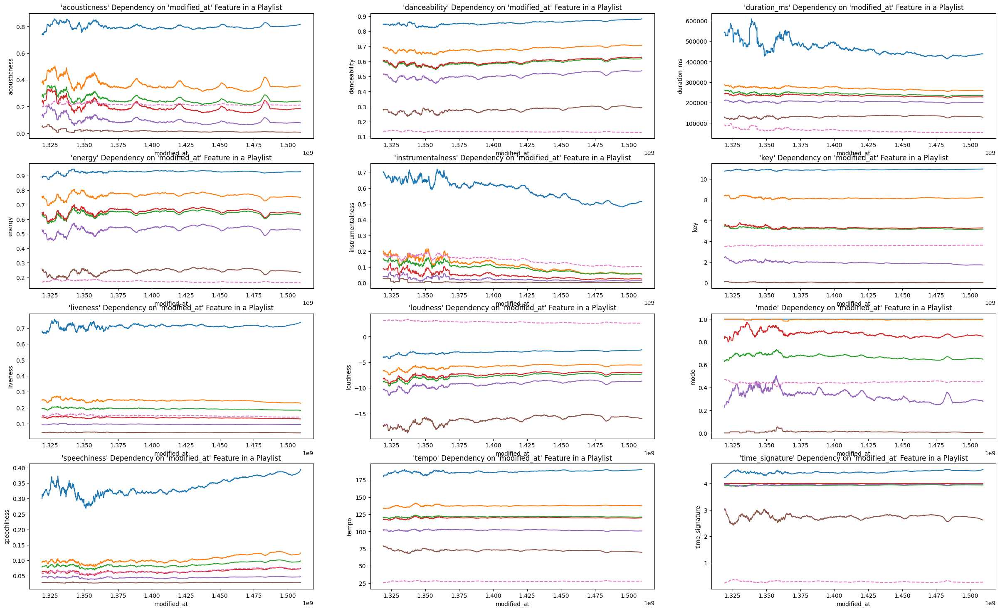

In [206]:
plot_dependency_table("modified_at", rolling_period = 50)

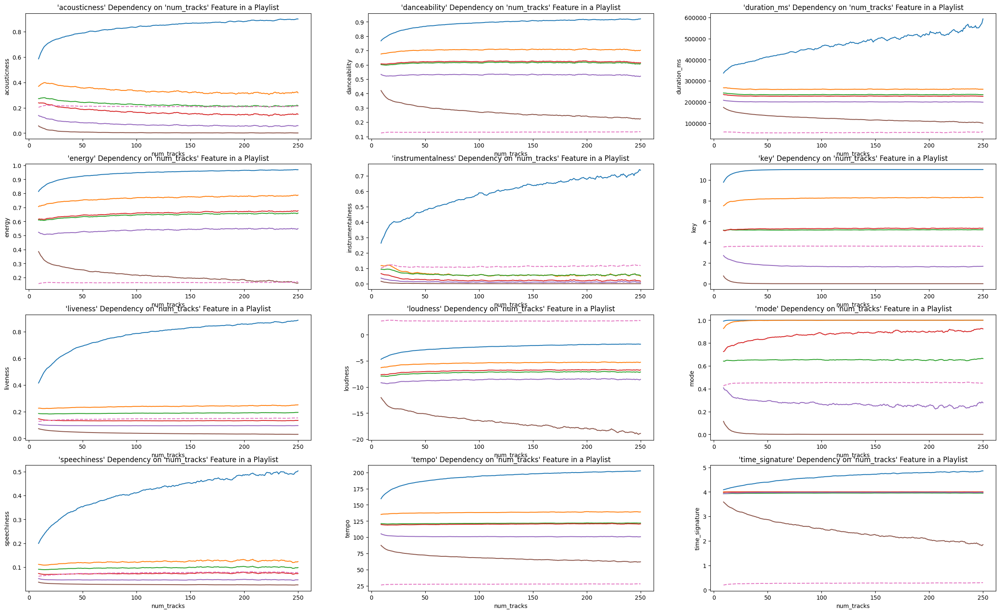

In [37]:
plot_dependency_table("num_tracks", rolling_period = 5)

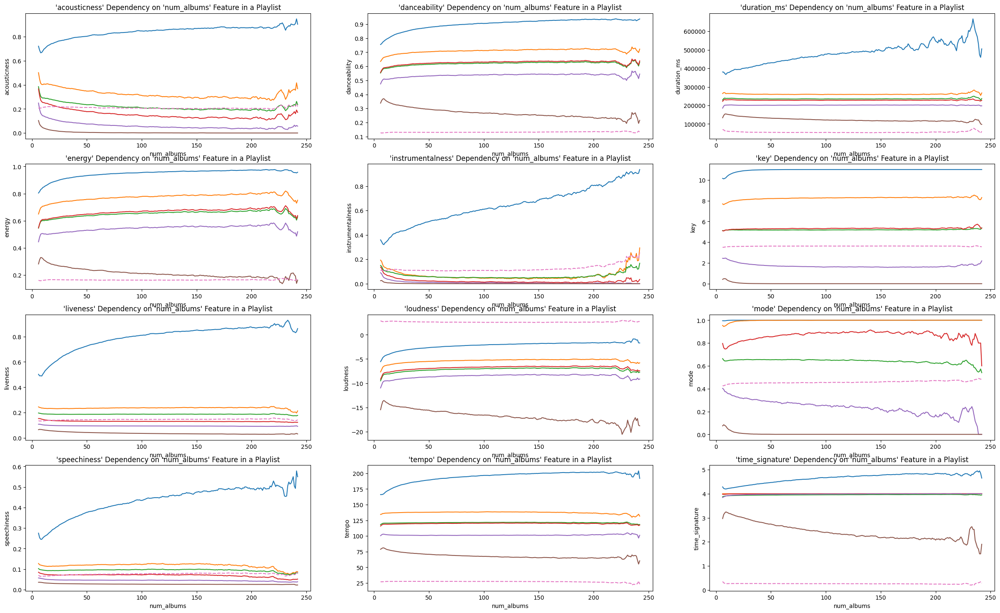

In [38]:
plot_dependency_table("num_albums", rolling_period = 5)

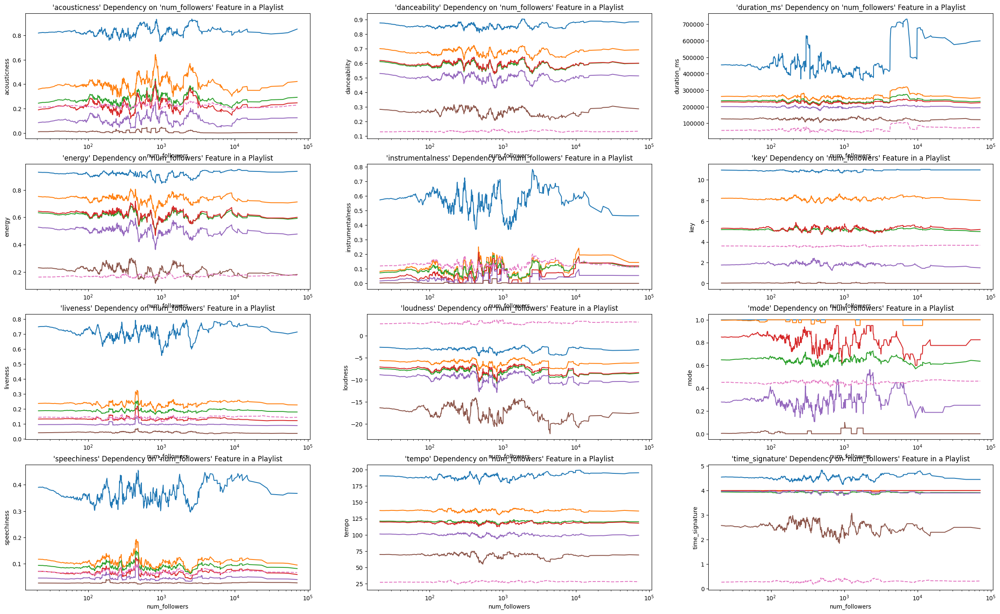

In [62]:
plot_dependency_table("num_followers", rolling_period = 20, x_log_scale = True)

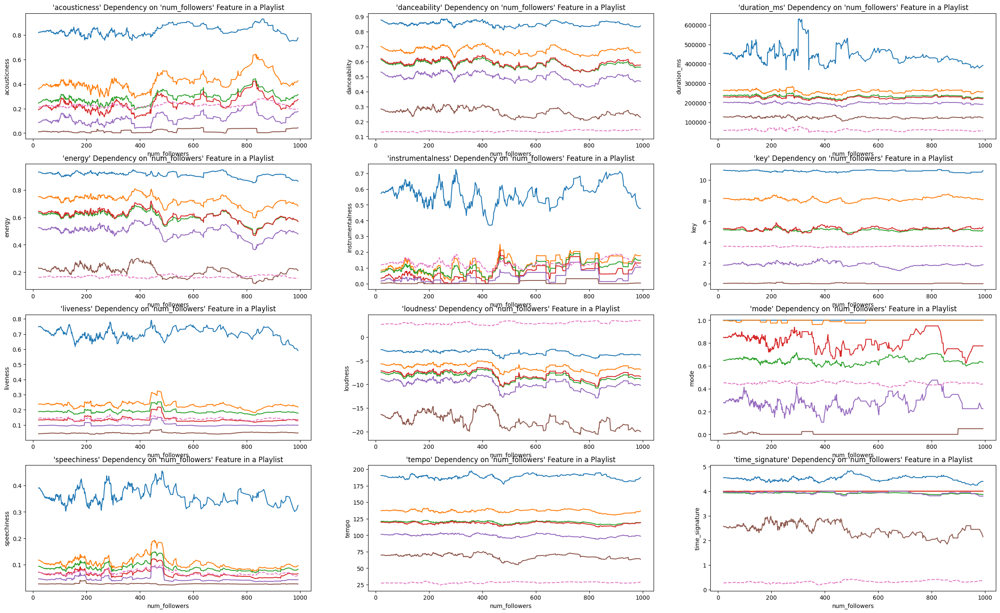

In [63]:
plot_dependency_table("num_followers", rolling_period = 20, max_value = 1000)

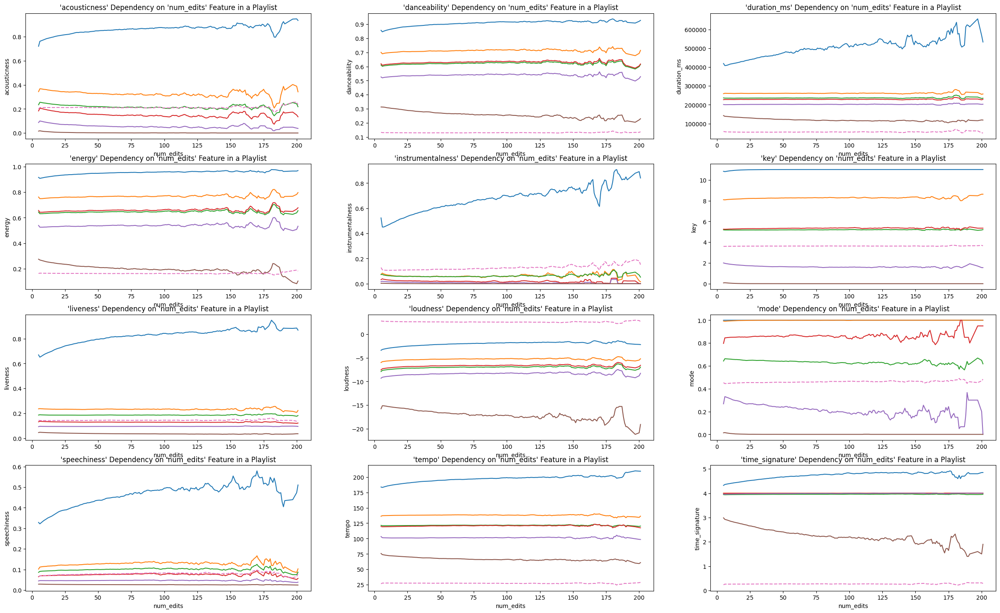

In [55]:
plot_dependency_table("num_edits", rolling_period = 5)

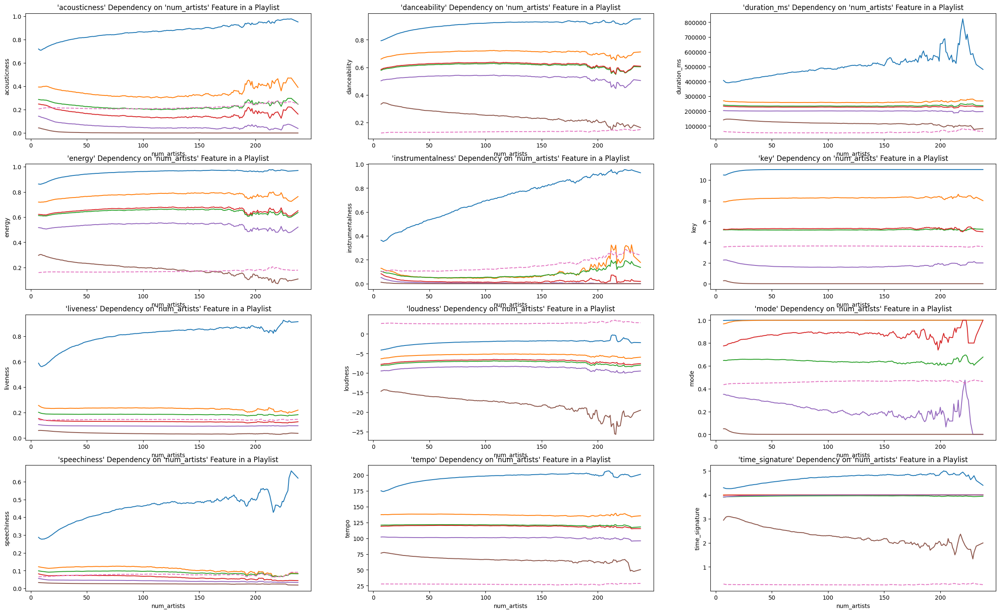

In [54]:
plot_dependency_table("num_artists", rolling_period = 5)

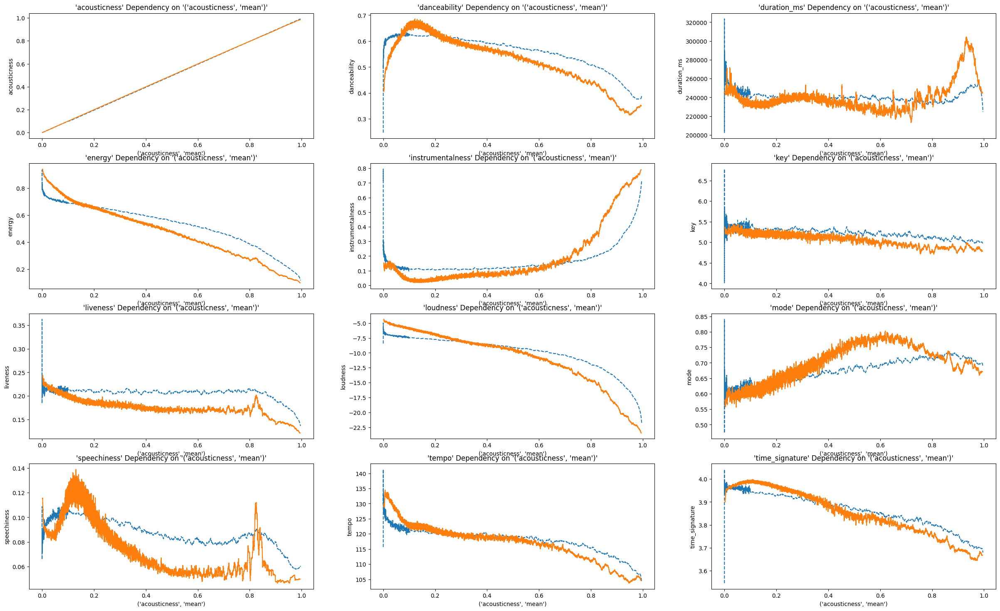

In [152]:
plot_playlist_existence_dependency_table(("acousticness", "mean"), rolling_period = 200, rolling_period_tracks = 10)

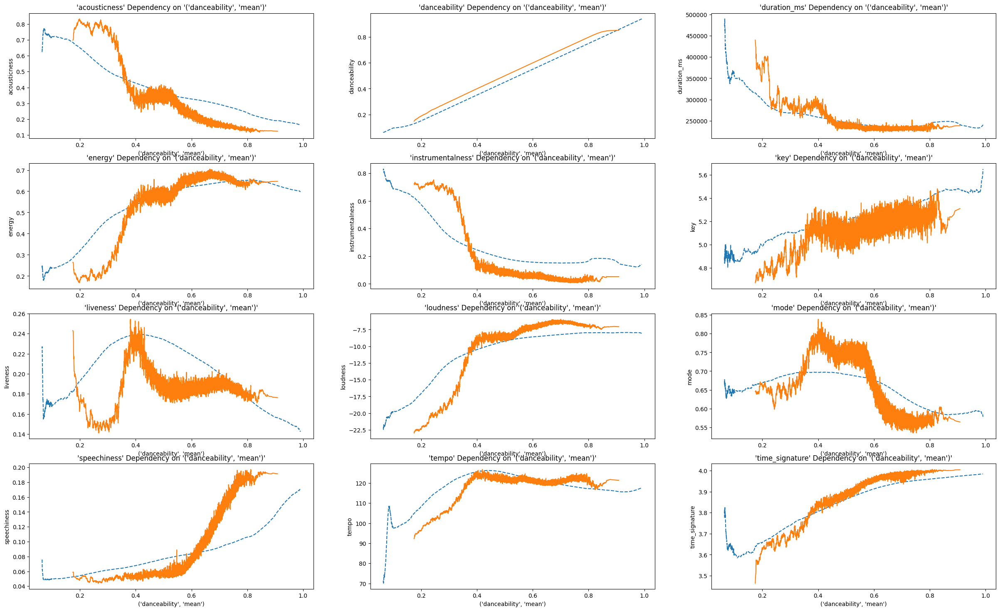

In [158]:
plot_playlist_existence_dependency_table(("danceability", "mean"), rolling_period = 100, rolling_period_tracks = 100)

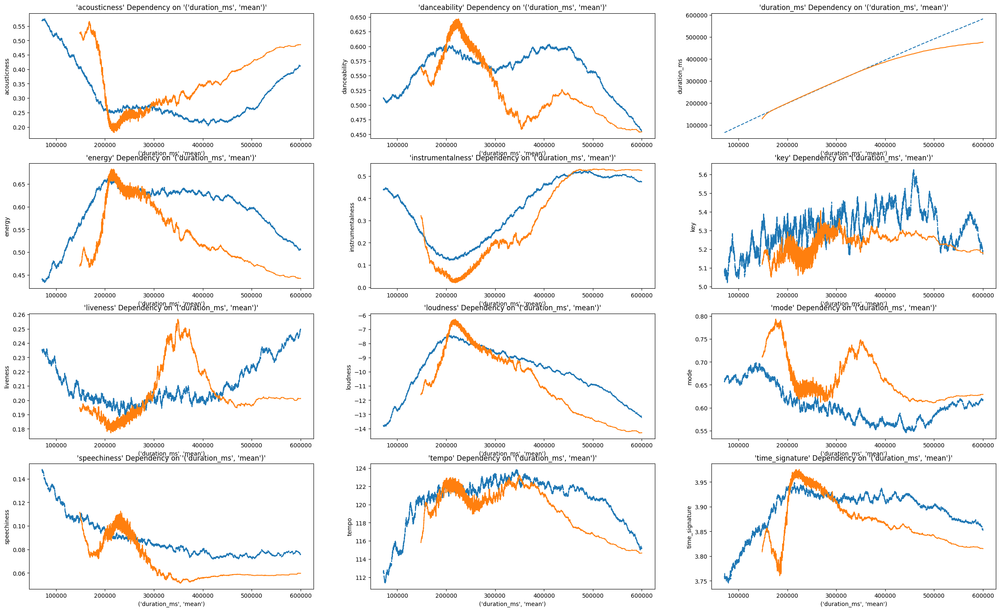

In [166]:
plot_playlist_existence_dependency_table(("duration_ms", "mean"), rolling_period = 500, rolling_period_tracks = 2500, min_value = 60000, max_value = 600000)

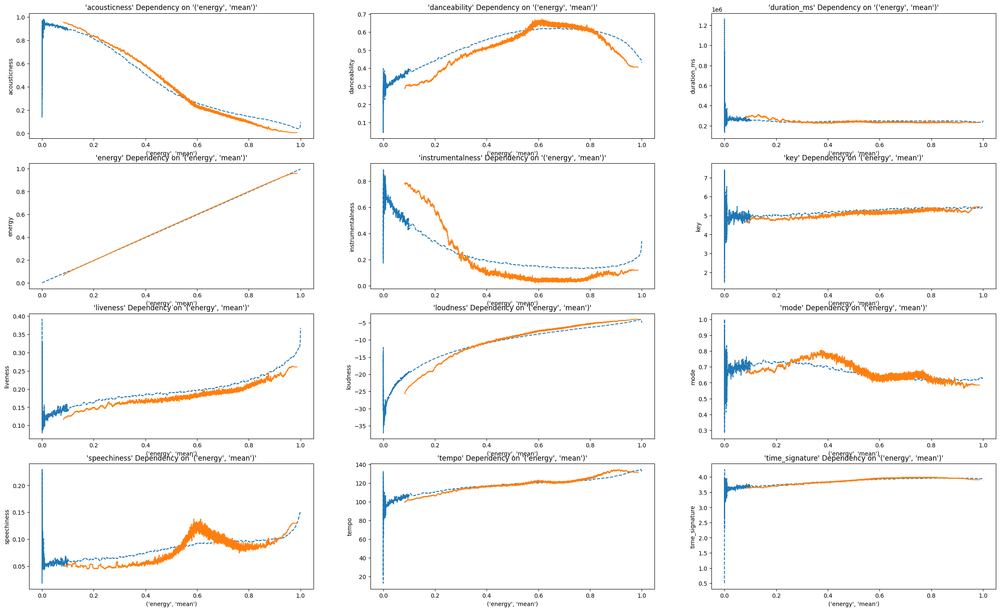

In [172]:
plot_playlist_existence_dependency_table(("energy", "mean"), rolling_period = 200, rolling_period_tracks = 10)

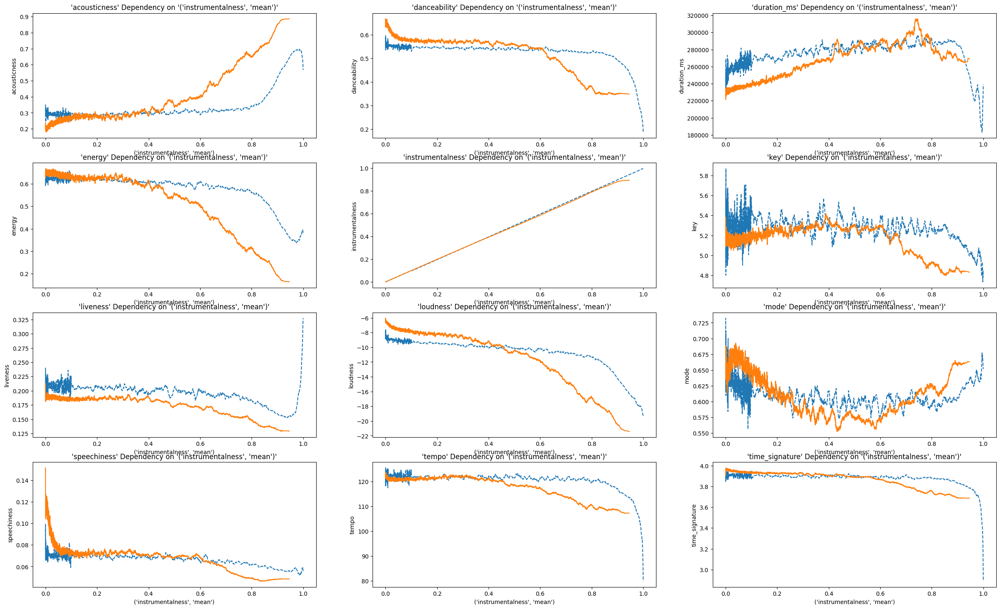

In [180]:
plot_playlist_existence_dependency_table(("instrumentalness", "mean"), rolling_period = 400, rolling_period_tracks = 10)

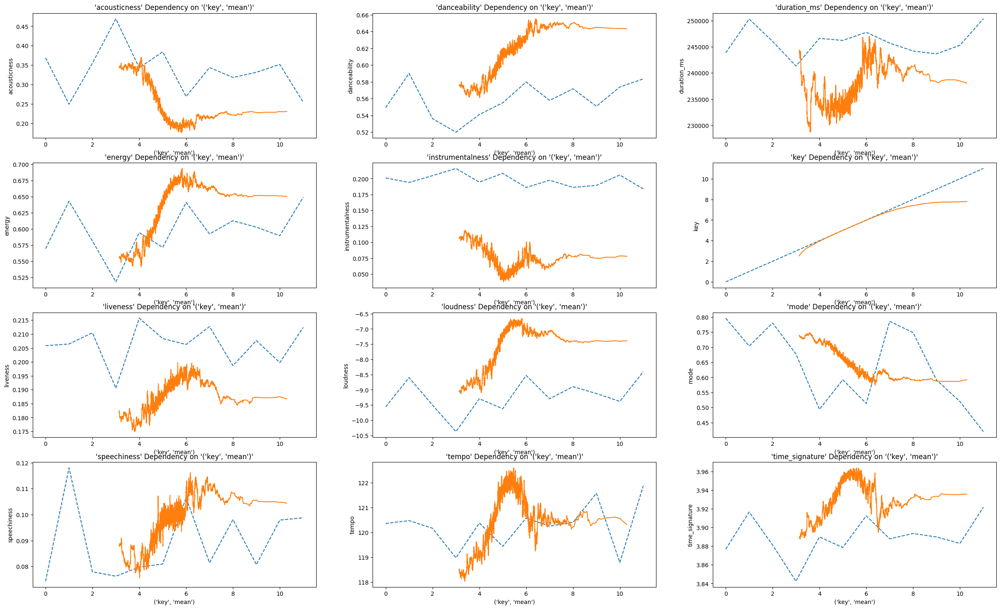

In [177]:
plot_playlist_existence_dependency_table(("key", "mean"), rolling_period = 200, rolling_period_tracks = 1)

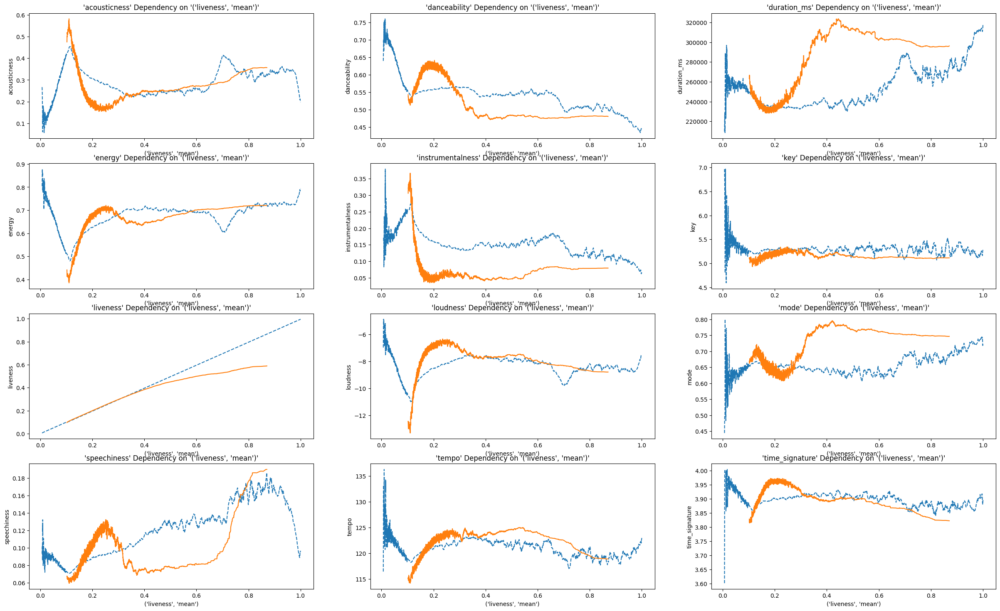

In [179]:
plot_playlist_existence_dependency_table(("liveness", "mean"), rolling_period = 400, rolling_period_tracks = 10)

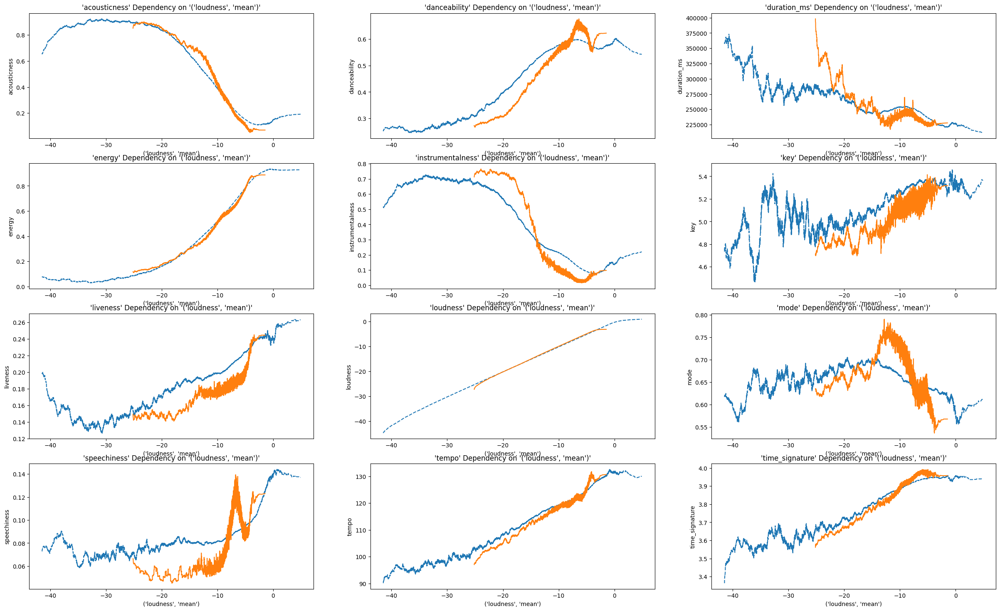

In [186]:
plot_playlist_existence_dependency_table(("loudness", "mean"), rolling_period = 200, rolling_period_tracks = 500)

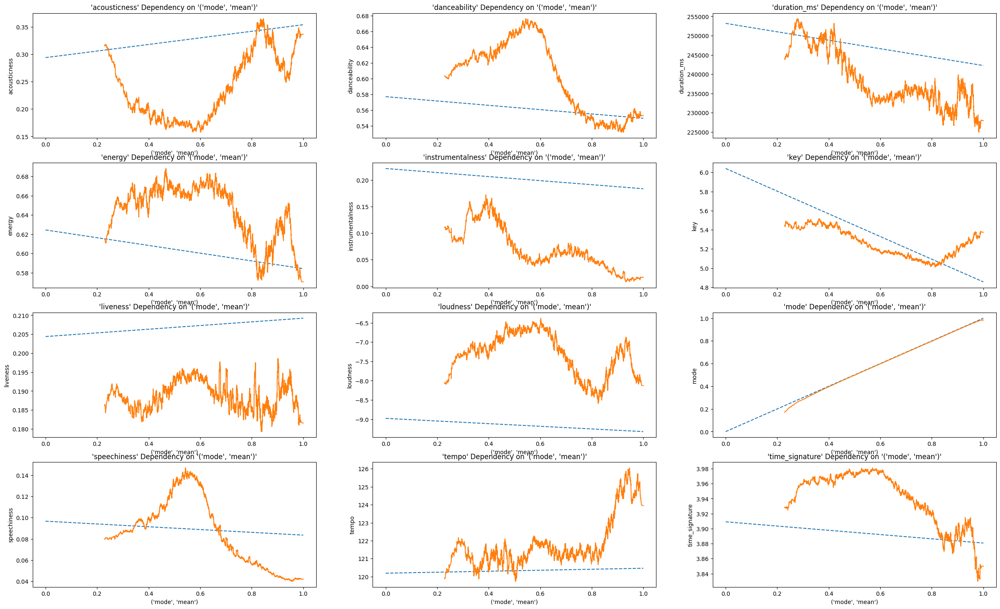

In [190]:
plot_playlist_existence_dependency_table(("mode", "mean"), rolling_period = 100, rolling_period_tracks = 1)

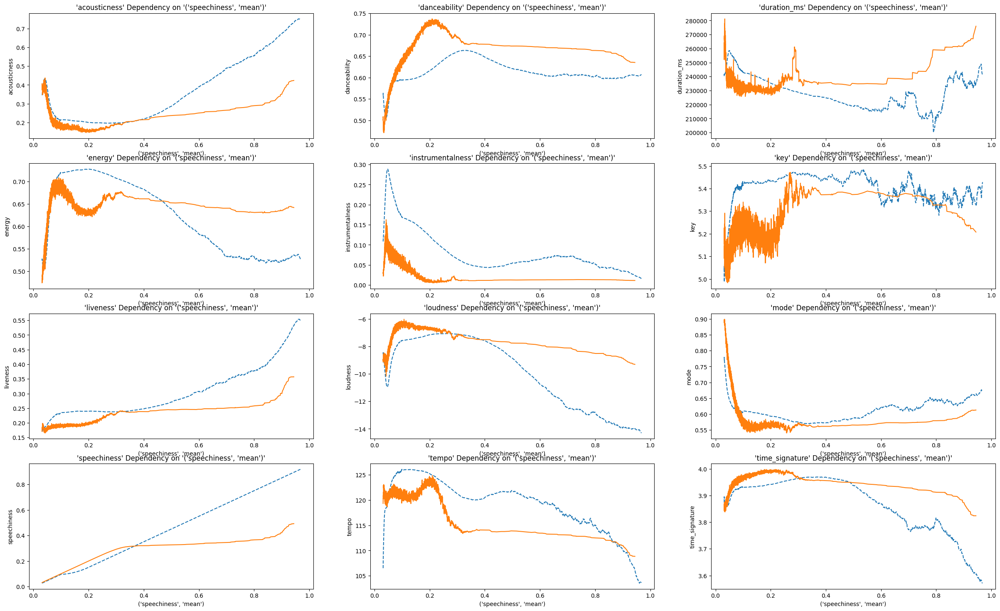

In [195]:
plot_playlist_existence_dependency_table(("speechiness", "mean"), rolling_period = 250, rolling_period_tracks = 100)

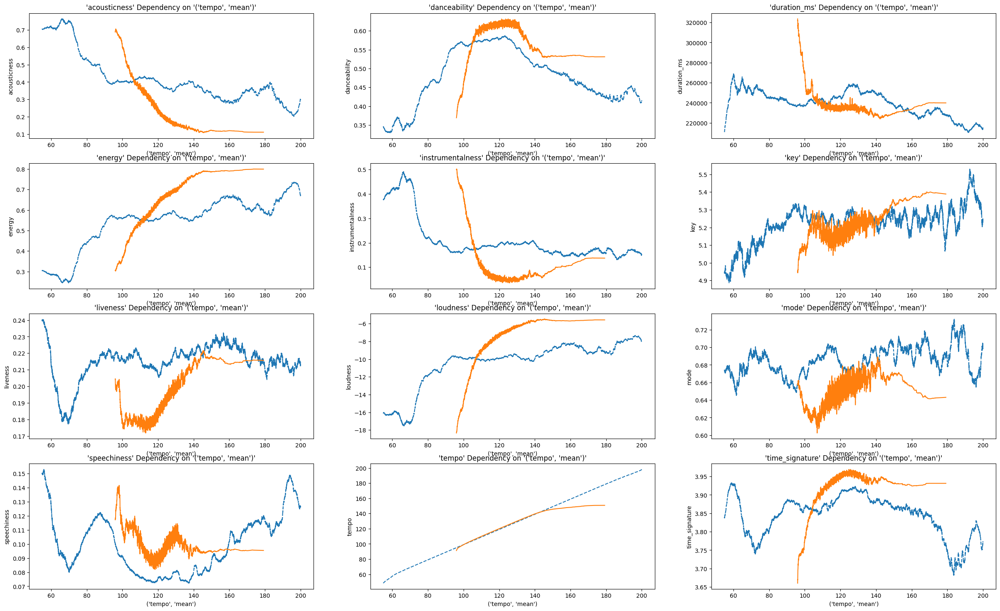

In [199]:
plot_playlist_existence_dependency_table(("tempo", "mean"), rolling_period = 500, rolling_period_tracks = 2000, max_value = 200)

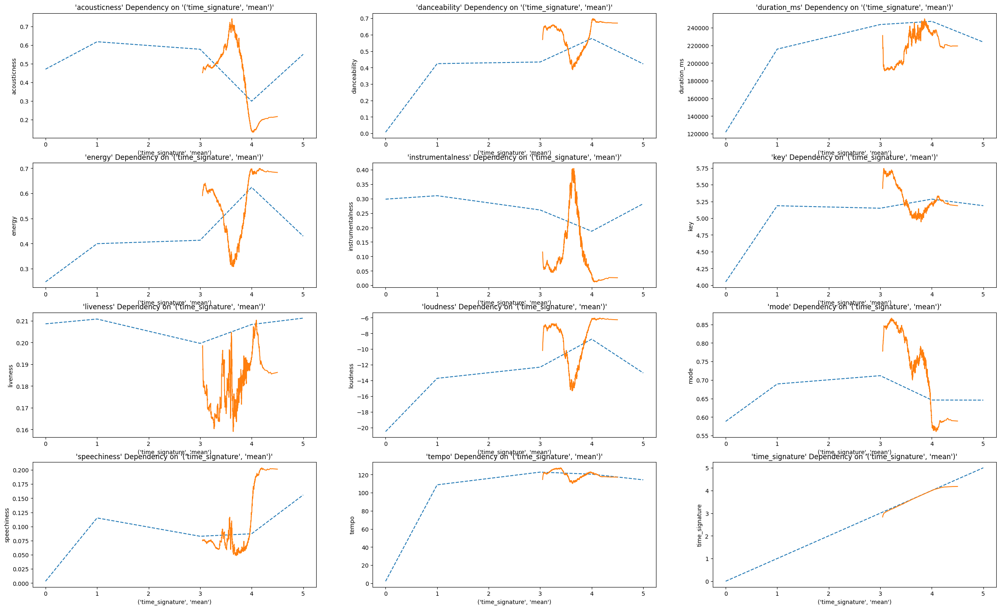

In [204]:
plot_playlist_existence_dependency_table(("time_signature", "mean"), rolling_period = 100, rolling_period_tracks = 1)

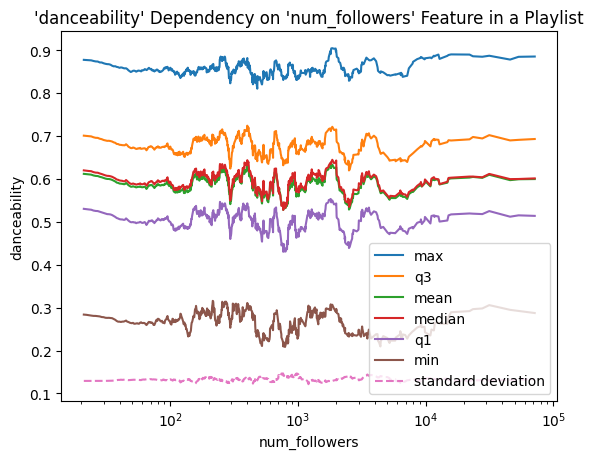

In [213]:
img, ax = plt.subplots(1, 1)
plot_trends("num_followers", "danceability", ax, rolling_period = 20, x_log_scale = True, save_to_file = True)

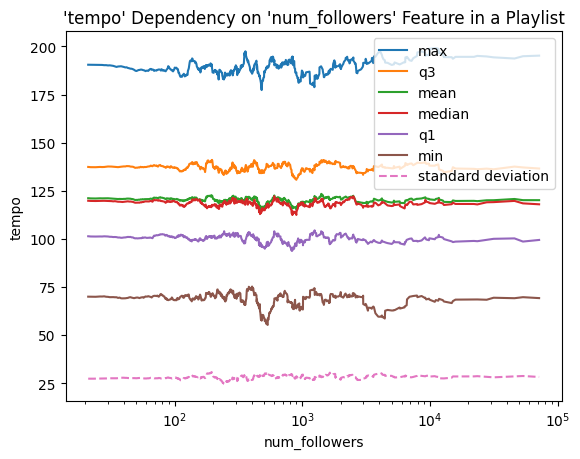

In [214]:
img, ax = plt.subplots(1, 1)
plot_trends("num_followers", "tempo", ax, rolling_period = 20, x_log_scale = True, save_to_file = True)

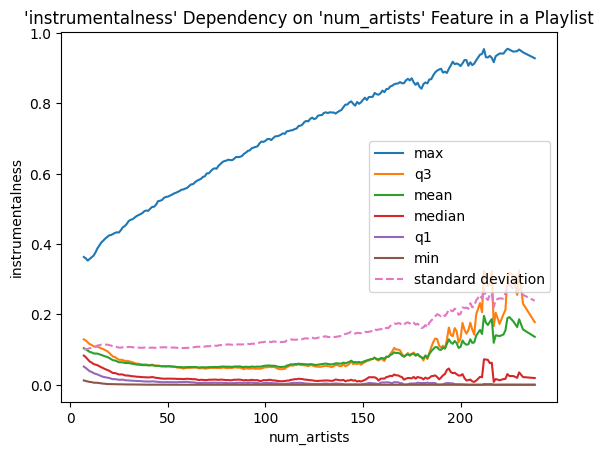

In [216]:
img, ax = plt.subplots(1, 1)
plot_trends("num_artists", "instrumentalness", ax, rolling_period = 5, save_to_file = True)

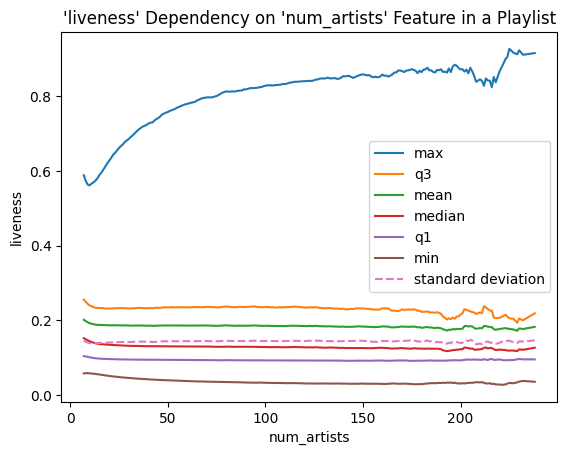

In [218]:
img, ax = plt.subplots(1, 1)
plot_trends("num_artists", "liveness", ax, rolling_period = 5, save_to_file = True)

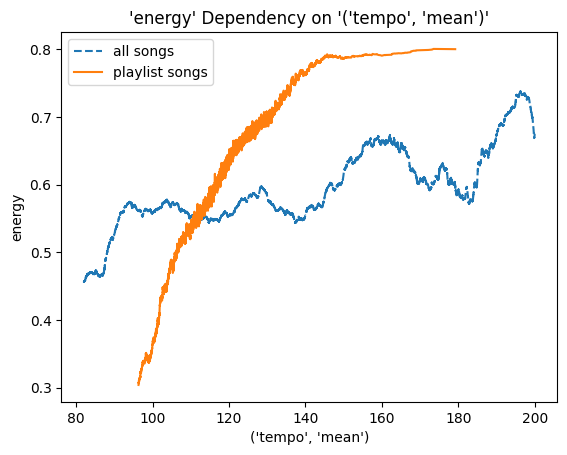

In [229]:
img, ax = plt.subplots(1, 1)
plot_playlist_existence_trend_comparison(("tempo", "mean"), "energy", ax, rolling_period = 500, rolling_period_tracks = 2000, min_value = 80, max_value = 200, save_to_file = True)

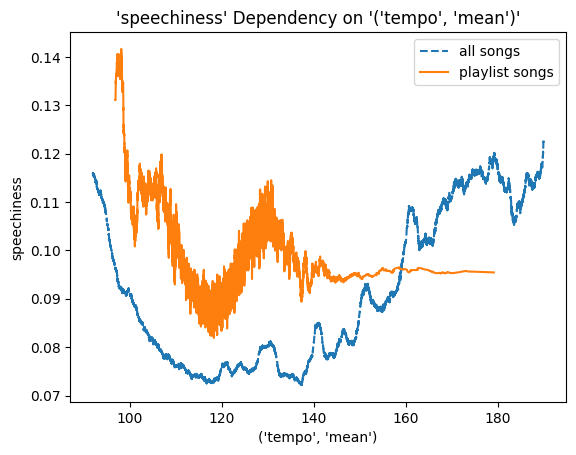

In [245]:
img, ax = plt.subplots(1, 1)
plot_playlist_existence_trend_comparison(("tempo", "mean"), "speechiness", ax, rolling_period = 500, rolling_period_tracks = 2000, min_value = 90, max_value = 190, save_to_file = True)

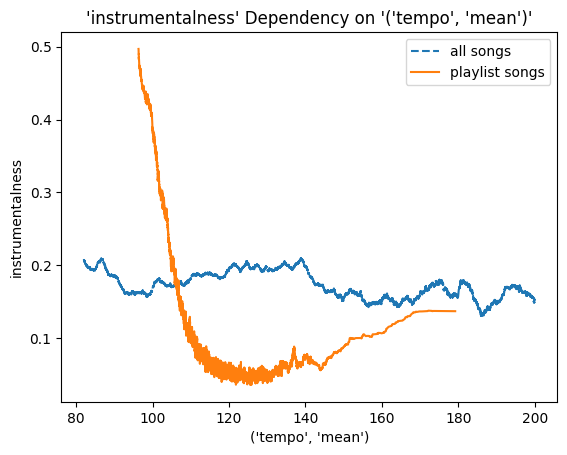

In [230]:
img, ax = plt.subplots(1, 1)
plot_playlist_existence_trend_comparison(("tempo", "mean"), "instrumentalness", ax, rolling_period = 500, rolling_period_tracks = 2000, min_value = 80, max_value = 200, save_to_file = True)

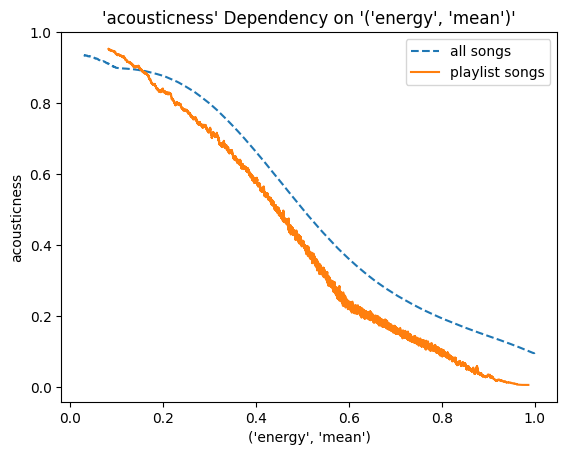

In [241]:
img, ax = plt.subplots(1, 1)
plot_playlist_existence_trend_comparison(("energy", "mean"), "acousticness", ax, rolling_period = 200, rolling_period_tracks = 200, save_to_file = True, min_value = 0.01)